In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
import matplotlib.dates
import datetime
import tensorflow as tf
from datetime import datetime
%matplotlib inline

In [2]:
df=pd.read_excel('POC Sample Data.xlsx')
df.head()

,DATETIME,WZ_Coast (BIDCLOSE_LOAD_FORECAST),WZ_ERCOT (BIDCLOSE_LOAD_FORECAST),WZ_East (BIDCLOSE_LOAD_FORECAST),WZ_FarWest (BIDCLOSE_LOAD_FORECAST),WZ_North (BIDCLOSE_LOAD_FORECAST),WZ_NorthCentral (BIDCLOSE_LOAD_FORECAST),WZ_SouthCentral (BIDCLOSE_LOAD_FORECAST),WZ_Southern (BIDCLOSE_LOAD_FORECAST),WZ_West (BIDCLOSE_LOAD_FORECAST),...,GR_NORTH (WINDDATA),GR_PANHANDLE (WINDDATA),GR_SOUTH (WINDDATA),GR_WEST (WINDDATA),ERCOT (GENERATION_SOLAR_RT),HOURENDING,MARKETDAY,PEAKTYPE,MONTH,YEAR
0,2022-01-01 01:00:00,10307.0996,37308.3496,1282.52,3657.7300,819.630,10433.5000,6365.8901,2852.1899,1589.7900,...,674.150000,3138.101667,1697.014167,2867.362500,0.109167,1,2022-01-01,NaN,JANUARY,2022
1,2022-01-01 02:00:00,10300.2002,36984.0036,1260.64,3660.2400,759.254,10346.5996,6287.0098,2842.3000,1527.7600,...,587.441667,3103.527500,1719.589167,3788.693333,0.099167,2,2022-01-01,NaN,JANUARY,2022
2,2022-01-01 03:00:00,10313.0000,36764.8666,1245.84,3668.4399,725.907,10346.5996,6146.4502,2785.6599,1532.9700,...,572.977500,3384.065000,1697.770833,5058.519167,0.098333,3,2022-01-01,NaN,JANUARY,2022
3,2022-01-01 04:00:00,10253.7998,36163.0723,1214.41,3673.6001,720.712,10158.9004,5922.2500,2701.7300,1517.6700,...,555.292500,3296.410000,1782.585833,7241.787500,0.105000,4,2022-01-01,NaN,JANUARY,2022
4,2022-01-01 05:00:00,10206.0996,35615.0476,1185.40,3668.7000,704.308,10016.0000,5733.7900,2646.4399,1454.3101,...,530.015833,2952.698333,2152.473333,9147.314167,0.112500,5,2022-01-01,NaN,JANUARY,2022


In [3]:
df.columns

Index(['DATETIME', 'WZ_Coast (BIDCLOSE_LOAD_FORECAST)',
       'WZ_ERCOT (BIDCLOSE_LOAD_FORECAST)', 'WZ_East (BIDCLOSE_LOAD_FORECAST)',
       'WZ_FarWest (BIDCLOSE_LOAD_FORECAST)',
       'WZ_North (BIDCLOSE_LOAD_FORECAST)',
       'WZ_NorthCentral (BIDCLOSE_LOAD_FORECAST)',
       'WZ_SouthCentral (BIDCLOSE_LOAD_FORECAST)',
       'WZ_Southern (BIDCLOSE_LOAD_FORECAST)',
       'WZ_West (BIDCLOSE_LOAD_FORECAST)', 'ERCOT (WIND_STWPF_BIDCLOSE)',
       'GR_COASTAL (WIND_STWPF_BIDCLOSE)', 'GR_ERCOT (WIND_STWPF_BIDCLOSE)',
       'GR_NORTH (WIND_STWPF_BIDCLOSE)', 'GR_PANHANDLE (WIND_STWPF_BIDCLOSE)',
       'GR_SOUTH (WIND_STWPF_BIDCLOSE)', 'GR_WEST (WIND_STWPF_BIDCLOSE)',
       'NORTH (ERCOT) (WIND_STWPF_BIDCLOSE)',
       'SOUTH_HOUSTON (WIND_STWPF_BIDCLOSE)',
       'WEST (ERCOT) (WIND_STWPF_BIDCLOSE)',
       'WEST_NORTH (WIND_STWPF_BIDCLOSE)', 'ERCOT (SOLAR_STPPF_BIDCLOSE)',
       'ERCOT (TOTAL_RESOURCE_CAP_OUT)', 'Katy (GASPRICE)', 'Henry (GASPRICE)',
       'HB_NORTH (DALMP)', 'H

In [4]:
df=df.drop(columns=['WZ_Coast (BIDCLOSE_LOAD_FORECAST)',
       'WZ_ERCOT (BIDCLOSE_LOAD_FORECAST)', 'WZ_East (BIDCLOSE_LOAD_FORECAST)',
       'WZ_FarWest (BIDCLOSE_LOAD_FORECAST)',
       'WZ_North (BIDCLOSE_LOAD_FORECAST)',
       'WZ_NorthCentral (BIDCLOSE_LOAD_FORECAST)',
       'WZ_SouthCentral (BIDCLOSE_LOAD_FORECAST)',
       'WZ_Southern (BIDCLOSE_LOAD_FORECAST)',
       'WZ_West (BIDCLOSE_LOAD_FORECAST)', 'ERCOT (WIND_STWPF_BIDCLOSE)',
       'GR_COASTAL (WIND_STWPF_BIDCLOSE)', 'GR_ERCOT (WIND_STWPF_BIDCLOSE)',
       'GR_NORTH (WIND_STWPF_BIDCLOSE)', 'GR_PANHANDLE (WIND_STWPF_BIDCLOSE)',
       'GR_SOUTH (WIND_STWPF_BIDCLOSE)', 'GR_WEST (WIND_STWPF_BIDCLOSE)',
       'NORTH (ERCOT) (WIND_STWPF_BIDCLOSE)',
       'SOUTH_HOUSTON (WIND_STWPF_BIDCLOSE)',
       'WEST (ERCOT) (WIND_STWPF_BIDCLOSE)',
       'WEST_NORTH (WIND_STWPF_BIDCLOSE)', 'ERCOT (SOLAR_STPPF_BIDCLOSE)',
       'ERCOT (TOTAL_RESOURCE_CAP_OUT)', 'Katy (GASPRICE)', 'Henry (GASPRICE)','MONTH','YEAR','MARKETDAY'              
                   ])

In [5]:
df.head()


,DATETIME,HB_NORTH (DALMP),HB_NORTH (RTLMP),WZ_Coast (RTLOAD),WZ_ERCOT (RTLOAD),WZ_East (RTLOAD),WZ_FarWest (RTLOAD),WZ_North (RTLOAD),WZ_NorthCentral (RTLOAD),WZ_SouthCentral (RTLOAD),...,WZ_West (RTLOAD),GR_COASTAL (WINDDATA),GR_ERCOT (WINDDATA),GR_NORTH (WINDDATA),GR_PANHANDLE (WINDDATA),GR_SOUTH (WINDDATA),GR_WEST (WINDDATA),ERCOT (GENERATION_SOLAR_RT),HOURENDING,PEAKTYPE
0,2022-01-01 01:00:00,33.41,64.3600,11593.13,38145.79,1347.52,3875.34,860.19,9544.22,6268.38,...,1321.09,3689.400833,12066.032500,674.150000,3138.101667,1697.014167,2867.362500,0.109167,1,NaN
1,2022-01-01 02:00:00,25.22,32.4475,11348.84,37158.13,1292.46,3804.58,851.10,9177.30,6054.79,...,1340.11,3680.723333,12879.973333,587.441667,3103.527500,1719.589167,3788.693333,0.099167,2,NaN
2,2022-01-01 03:00:00,22.91,25.5400,11007.41,35966.24,1293.34,3840.64,854.40,8756.47,5771.56,...,1275.86,3654.858333,14368.191667,572.977500,3384.065000,1697.770833,5058.519167,0.098333,3,NaN
3,2022-01-01 04:00:00,18.41,22.4175,10850.64,35148.96,1240.84,3896.01,834.95,8538.38,5529.97,...,1201.22,3590.854167,16466.927500,555.292500,3296.410000,1782.585833,7241.787500,0.105000,4,NaN
4,2022-01-01 05:00:00,12.19,15.9475,10645.95,34610.33,1216.43,3953.56,826.74,8480.78,5419.03,...,1084.98,3553.947500,18336.449167,530.015833,2952.698333,2152.473333,9147.314167,0.112500,5,NaN


These are columns present in the Dataset

### Finding null values

In [6]:
df.isnull().sum()


DATETIME                          0
HB_NORTH (DALMP)                 48
HB_NORTH (RTLMP)                 82
WZ_Coast (RTLOAD)                85
WZ_ERCOT (RTLOAD)                85
WZ_East (RTLOAD)                 85
WZ_FarWest (RTLOAD)              85
WZ_North (RTLOAD)                85
WZ_NorthCentral (RTLOAD)         85
WZ_SouthCentral (RTLOAD)         85
WZ_Southern (RTLOAD)             85
WZ_West (RTLOAD)                 85
GR_COASTAL (WINDDATA)            82
GR_ERCOT (WINDDATA)              82
GR_NORTH (WINDDATA)              82
GR_PANHANDLE (WINDDATA)          82
GR_SOUTH (WINDDATA)              82
GR_WEST (WINDDATA)               82
ERCOT (GENERATION_SOLAR_RT)      82
HOURENDING                        0
PEAKTYPE                       5519
dtype: int64

cc_ce_start and cc_ce_end colums are mostly empty so i will be removing them

<AxesSubplot:>

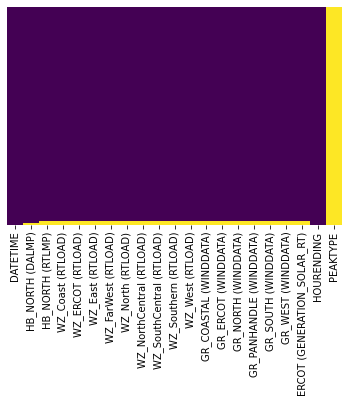

In [7]:
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

Yellow color shows empty null values in the data set

In [8]:
df.count()

DATETIME                       5519
HB_NORTH (DALMP)               5471
HB_NORTH (RTLMP)               5437
WZ_Coast (RTLOAD)              5434
WZ_ERCOT (RTLOAD)              5434
WZ_East (RTLOAD)               5434
WZ_FarWest (RTLOAD)            5434
WZ_North (RTLOAD)              5434
WZ_NorthCentral (RTLOAD)       5434
WZ_SouthCentral (RTLOAD)       5434
WZ_Southern (RTLOAD)           5434
WZ_West (RTLOAD)               5434
GR_COASTAL (WINDDATA)          5437
GR_ERCOT (WINDDATA)            5437
GR_NORTH (WINDDATA)            5437
GR_PANHANDLE (WINDDATA)        5437
GR_SOUTH (WINDDATA)            5437
GR_WEST (WINDDATA)             5437
ERCOT (GENERATION_SOLAR_RT)    5437
HOURENDING                     5519
PEAKTYPE                          0
dtype: int64

Total Records 

In [9]:
df=df.drop(columns=["PEAKTYPE",'HOURENDING'])

In [10]:
df=df.dropna()
df.isnull().sum()
df.count()

DATETIME                       5434
HB_NORTH (DALMP)               5434
HB_NORTH (RTLMP)               5434
WZ_Coast (RTLOAD)              5434
WZ_ERCOT (RTLOAD)              5434
WZ_East (RTLOAD)               5434
WZ_FarWest (RTLOAD)            5434
WZ_North (RTLOAD)              5434
WZ_NorthCentral (RTLOAD)       5434
WZ_SouthCentral (RTLOAD)       5434
WZ_Southern (RTLOAD)           5434
WZ_West (RTLOAD)               5434
GR_COASTAL (WINDDATA)          5434
GR_ERCOT (WINDDATA)            5434
GR_NORTH (WINDDATA)            5434
GR_PANHANDLE (WINDDATA)        5434
GR_SOUTH (WINDDATA)            5434
GR_WEST (WINDDATA)             5434
ERCOT (GENERATION_SOLAR_RT)    5434
dtype: int64

Total Records available for processing

## Creating temp dataframe for processing

In [11]:
dft=df


# Exploratory Data Analysis

<AxesSubplot:>

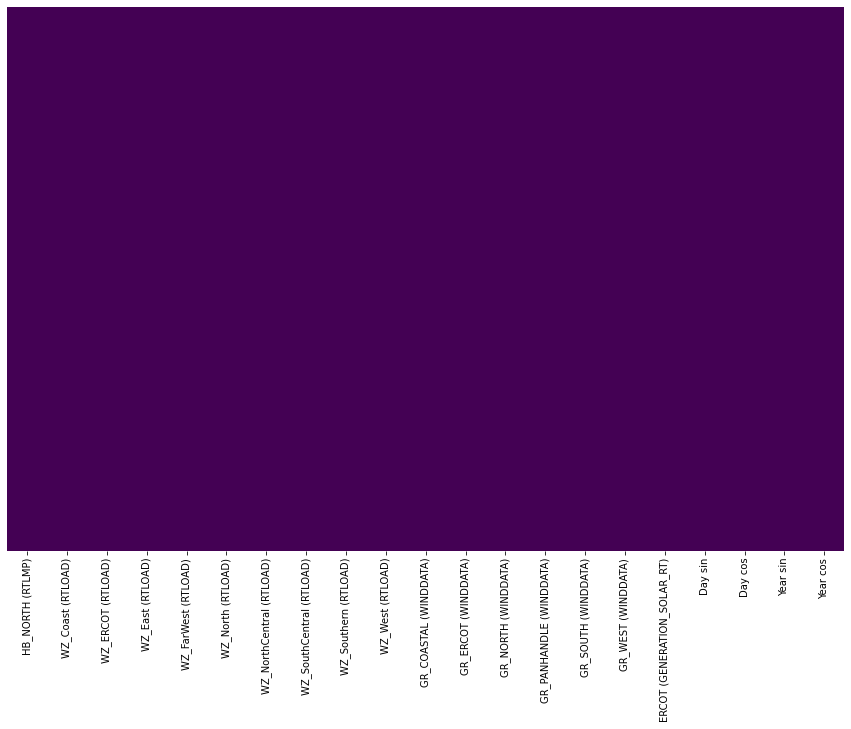

In [65]:
sns.heatmap(dfrt.isnull(),yticklabels=False,cbar=False,cmap='viridis')

Plot shows Null Values in yellow if any

C:\Users\Piyush\miniconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  after removing the cwd from sys.path.


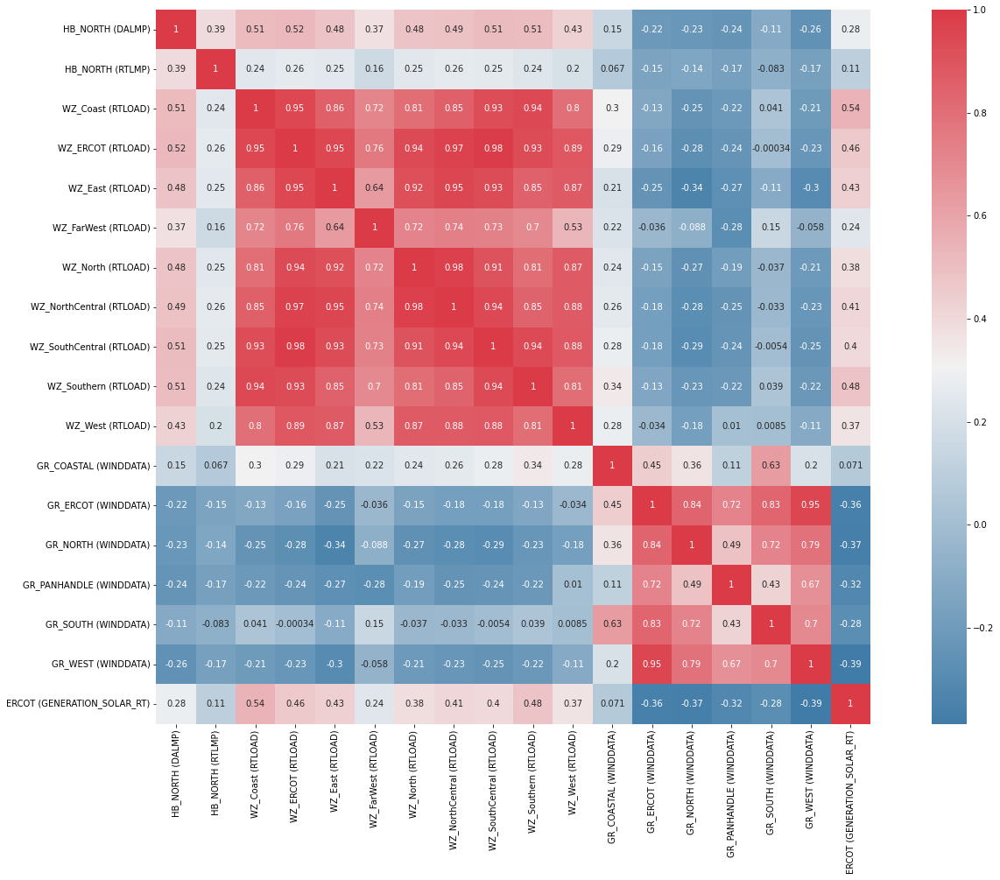

In [13]:
#Get Correlation of "consumption" with other variables:
f, ax = plt.subplots(figsize=(25, 15))
corr = df.corr()
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool), cmap=sns.diverging_palette(240,10,as_cmap=True),
            square=True, ax=ax,annot=True)
plt.show()

Checking correlation within data to see relationship between features, and the strength of that relationship 

In [7]:
date_time = pd.to_datetime(df.pop('DATETIME'), format='%d.%m.%Y %H:%M:%S')
mpl.rcParams['figure.figsize'] = (15, 10)
mpl.rcParams['axes.grid'] = False

Text(0.5, 1.0, 'A small sample of DayAhead Price and RT price ')

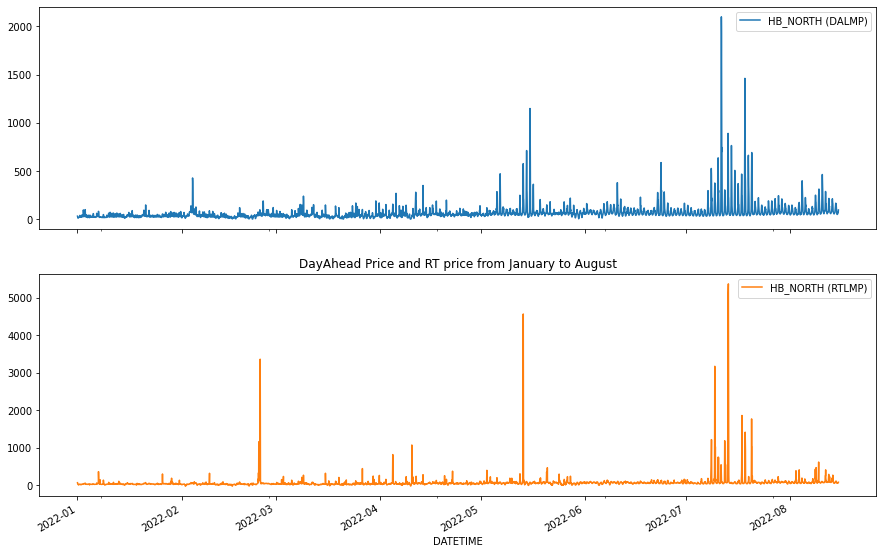

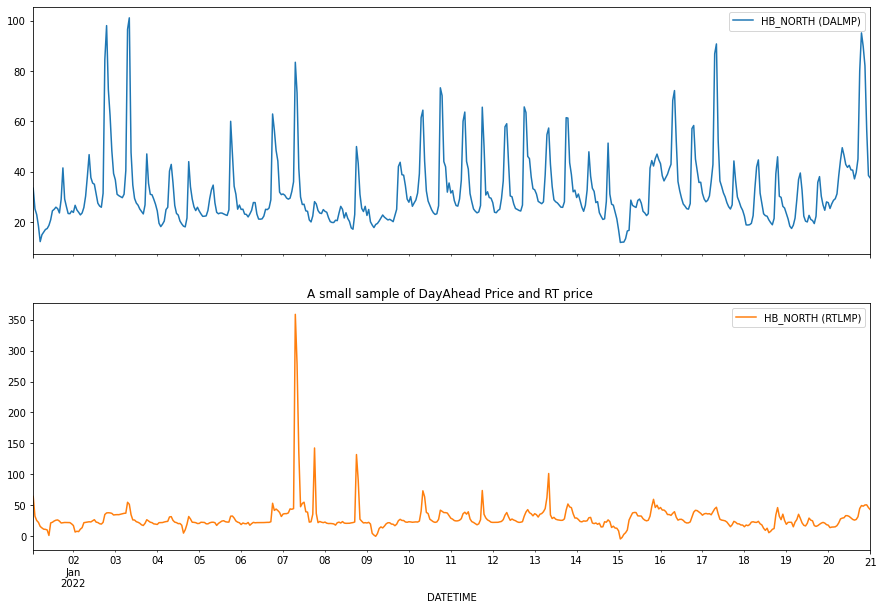

In [15]:
plot_cols = ['HB_NORTH (DALMP)', 'HB_NORTH (RTLMP)']
plot_features = df[plot_cols]
plot_features.index = date_time
_ = plot_features.plot(subplots=True)
plt.title('DayAhead Price and RT price from January to August')

plot_features = df[plot_cols][:480]
plot_features.index = date_time[:480]
_ = plot_features.plot(subplots=True)
plt.title('A small sample of DayAhead Price and RT price ')


Data is populated with Mr and Mrs titles

Text(0.5, 1.0, 'Solar Generation')

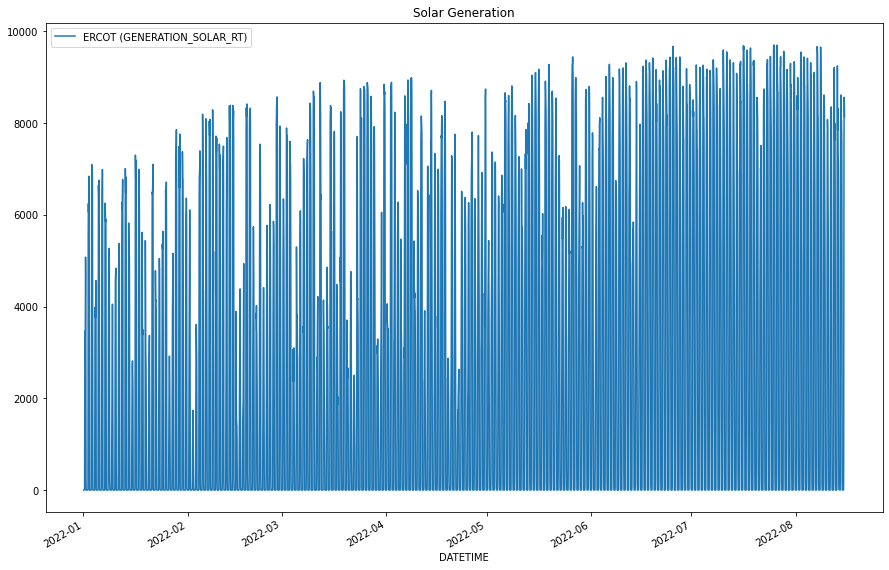

In [18]:
plot_cols = ['ERCOT (GENERATION_SOLAR_RT)']
plot_features = df[plot_cols]
plot_features.index = date_time
_ = plot_features.plot(subplots=True)
plt.title('Solar Generation')

Text(0.5, 1.0, 'Wind in North and South')

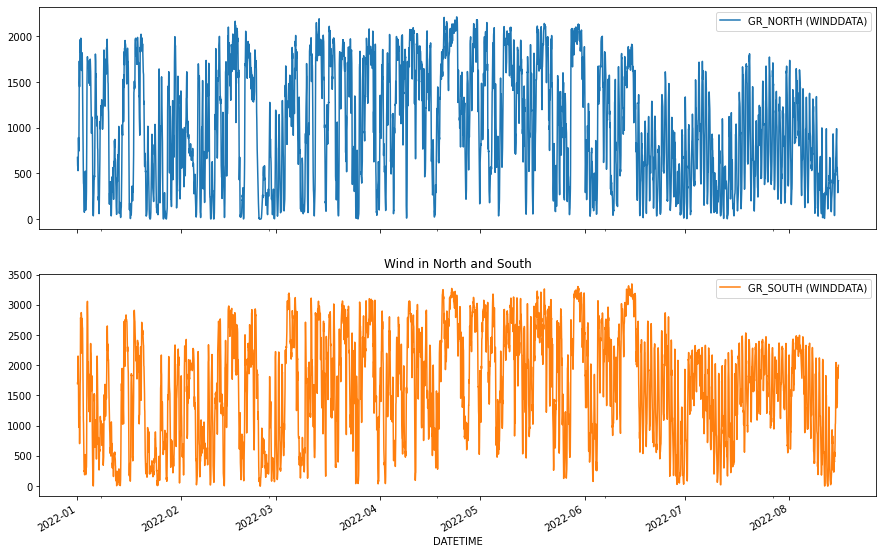

In [19]:
plot_cols = [ 'GR_NORTH (WINDDATA)',
        'GR_SOUTH (WINDDATA)']
plot_features = df[plot_cols]
plot_features.index = date_time
_ = plot_features.plot(subplots=True)
plt.title('Wind in North and South')

In [60]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
HB_NORTH (DALMP),5434.0,66.508738,89.451801,2.370000,32.732500,4.886000e+01,69.760000,2100.110000
HB_NORTH (RTLMP),5434.0,65.938034,202.454489,-29.695000,26.396250,4.350500e+01,65.953125,5365.847500
WZ_Coast (RTLOAD),5434.0,13566.918918,2853.122124,8749.860000,11461.235000,1.284298e+04,15335.980000,21081.940000
WZ_ERCOT (RTLOAD),5434.0,50356.130585,11211.580393,31955.060000,41710.062500,4.765053e+04,57228.747500,79827.910000
WZ_East (RTLOAD),5434.0,1871.029220,472.484374,828.820000,1504.117500,1.769250e+03,2197.575000,3113.530000
WZ_FarWest (RTLOAD),5434.0,4549.352028,370.755418,3605.080000,4255.507500,4.473395e+03,4839.395000,5519.610000
WZ_North (RTLOAD),5434.0,1309.683462,316.370405,707.090000,1064.365000,1.238375e+03,1498.152500,2216.770000
WZ_NorthCentral (RTLOAD),5434.0,15222.688257,4302.862557,8067.610000,11901.552500,1.421124e+04,17901.542500,27389.920000
WZ_SouthCentral (RTLOAD),5434.0,8320.284823,2175.253966,4832.030000,6629.422500,7.806780e+03,9747.967500,13931.800000
WZ_Southern (RTLOAD),5434.0,3982.178079,934.006158,2327.060000,3245.200000,3.779580e+03,4654.217500,6296.450000


In [17]:
timestamp_s = date_time.map(pd.Timestamp.timestamp)

In [18]:
day = 24*60*60
year = (365.2425)*day

df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

Text(0.5, 1.0, 'Time of day signal')

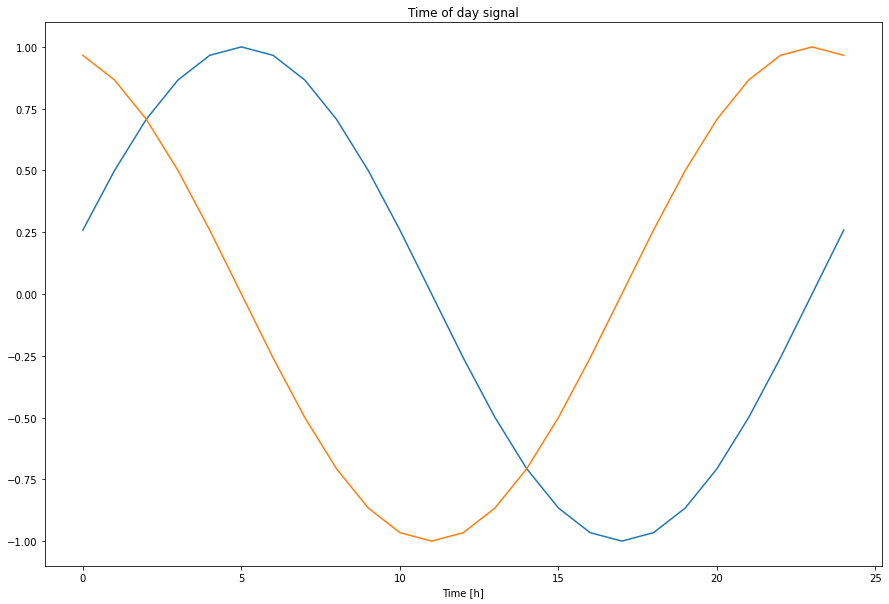

In [19]:
plt.plot(np.array(df['Day sin'])[:25])
plt.plot(np.array(df['Day cos'])[:25])
plt.xlabel('Time [h]')
plt.title('Time of day signal')

In [22]:
dfrt=df.drop(columns=['HB_NORTH (DALMP)'])
dfda=df.drop(columns=['HB_NORTH (RTLMP)'])

In [29]:
column_indices = {name: i for i, name in enumerate(df.columns)}

n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]

In [30]:
num_features


20

In [31]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

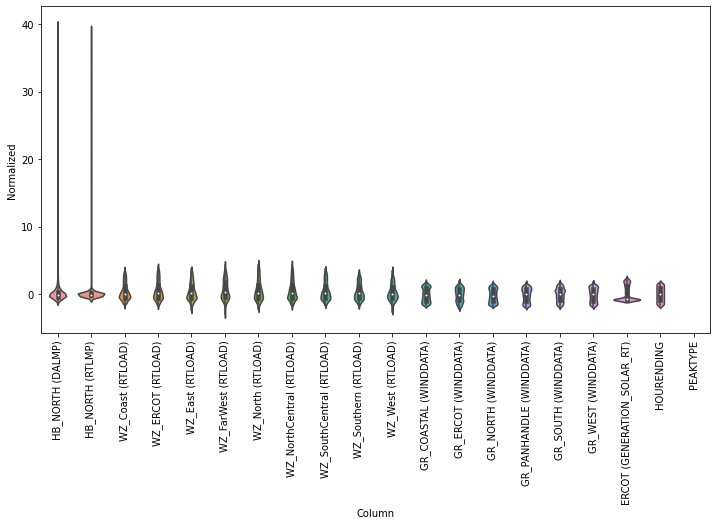

In [32]:
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

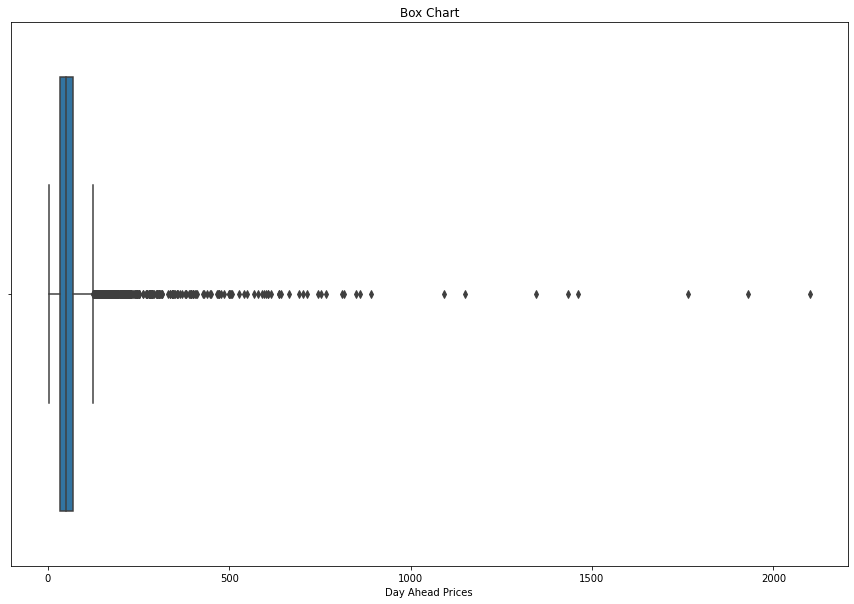

In [28]:
ax = sns.boxplot(x =df['HB_NORTH (DALMP)'])
ax.set(xlabel = "Day Ahead Prices", title = 'Box Chart');


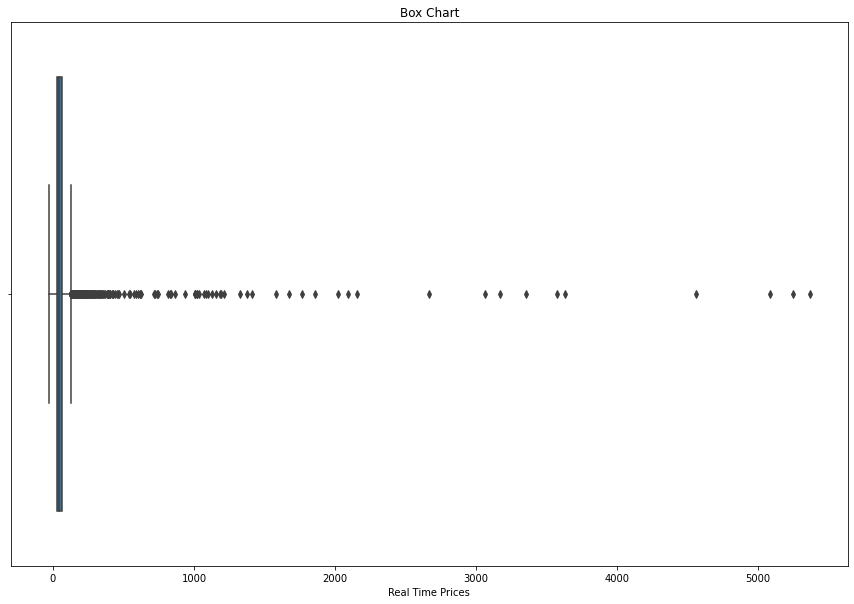

In [29]:
ax1 = sns.boxplot(x =df['HB_NORTH (RTLMP)'])
ax1.set(xlabel = "Real Time Prices", title = 'Box Chart');


cc_consumption for men is more than women Men are denoted by 0 while women are denoted by 1

Mademoiselle shows the highes range expansion and has the maximum cc_consumption. Madame and Monsieur have similar consumption. Most frequent cc_consumption is in Range of 400-480 

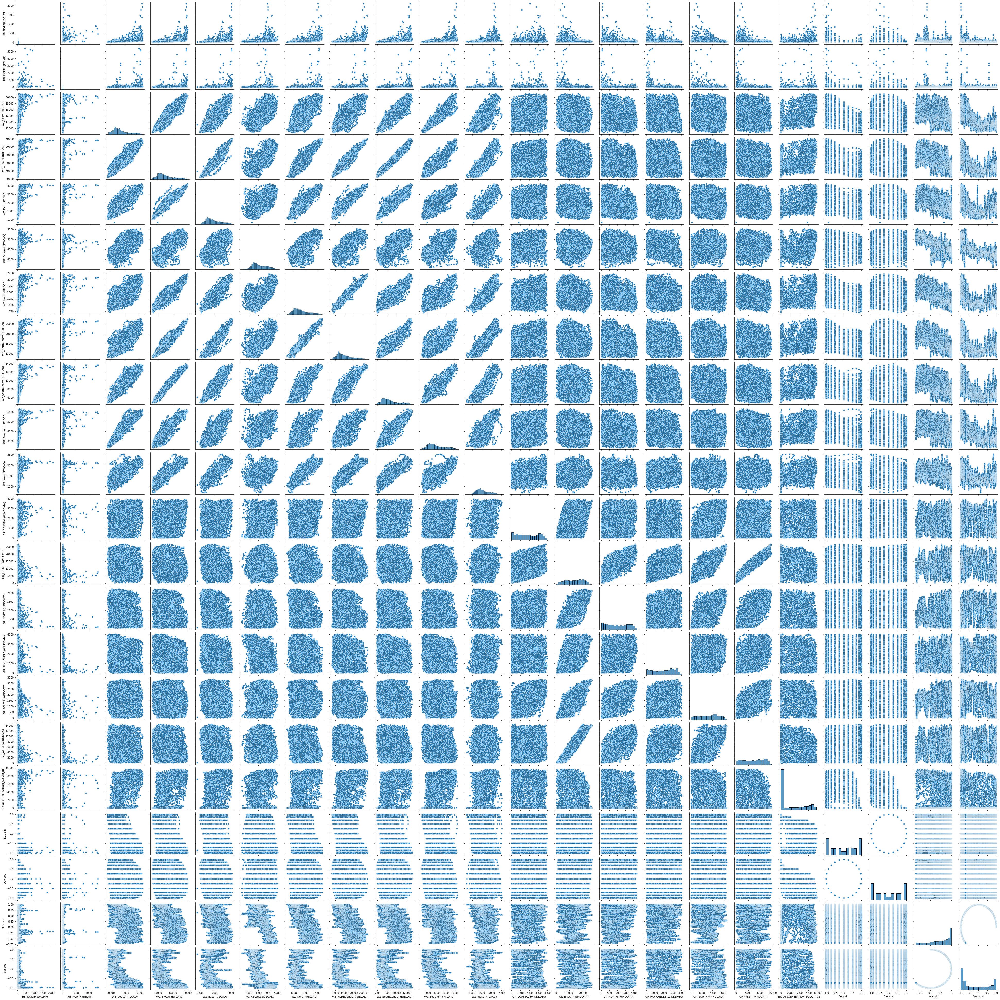

In [30]:
sns.pairplot(df)

To see Inter-column relationship

# Train Test Split

In [31]:
class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

In [33]:
def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [34]:
# Stack three slices, the length of the total window.
example_window = tf.stack([np.array(train_df[:w2.total_window_size]),
                           np.array(train_df[100:100+w2.total_window_size]),
                           np.array(train_df[200:200+w2.total_window_size])])

example_inputs, example_labels = w2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'Labels shape: {example_labels.shape}')

All shapes are: (batch, time, features)
Window shape: (3, 7, 21)
Inputs shape: (3, 6, 21)
Labels shape: (3, 2, 1)


In [68]:
def plot(self, model=None, plot_col='HB_NORTH (RTLMP)', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot

In [37]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

In [38]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [82]:
MAX_EPOCHS = 70

def compile_and_fit(model, window, patience=2):

  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      )
  return history

In [39]:
# Each element is an (inputs, label) pair.
w2.train.element_spec

(TensorSpec(shape=(None, 6, 21), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 2, 1), dtype=tf.float32, name=None))

In [40]:
for example_inputs, example_labels in w2.train.take(1):
  print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  print(f'Labels shape (batch, time, features): {example_labels.shape}')

Inputs shape (batch, time, features): (32, 6, 21)
Labels shape (batch, time, features): (32, 2, 1)


In [75]:
wide_window = WindowGenerator(
    input_width=24, label_width=24, shift=1,
    label_columns=['HB_NORTH (RTLMP)'])

wide_window

Total window size: 25
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Label column name(s): ['HB_NORTH (RTLMP)']

In [48]:
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', baseline(wide_window.example[0]).shape)

Input shape: (32, 24, 21)
Output shape: (32, 24, 21)


In [70]:
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]

In [71]:
baseline = Baseline()
baseline.compile(loss=tf.keras.losses.MeanSquaredError(),
                 metrics=[tf.keras.metrics.MeanAbsoluteError()])

In [72]:
val_performance = {}
performance = {}
val_performance['Baseline'] = baseline.evaluate(wide_window.val)
performance['Baseline'] = baseline.evaluate(wide_window.test, verbose=0)

34/34 [==============================] - 1s 13ms/step - loss: 10.1229 - mean_absolute_error: 1.6325


In [83]:

lstm_model = tf.keras.models.Sequential([
    tf.keras.layers.LSTM(64, return_sequences=True),
    tf.keras.layers.LSTM(64, return_sequences=True),
    tf.keras.layers.Dense(units=num_features)
])

history = compile_and_fit(lstm_model, wide_window)

val_performance['LSTM'] = lstm_model.evaluate( wide_window.val)
performance['LSTM'] = lstm_model.evaluate( wide_window.test, verbose=0)

Epoch 1/70
119/119 [==============================] - 4s 15ms/step - loss: 0.8452 - mean_absolute_error: 0.1908 - val_loss: 5.5161 - val_mean_absolute_error: 0.5022
Epoch 2/70
119/119 [==============================] - 1s 10ms/step - loss: 0.5386 - mean_absolute_error: 0.1619 - val_loss: 4.2073 - val_mean_absolute_error: 0.4729
Epoch 3/70
119/119 [==============================] - 1s 10ms/step - loss: 0.3417 - mean_absolute_error: 0.1412 - val_loss: 3.4919 - val_mean_absolute_error: 0.4114
Epoch 4/70
119/119 [==============================] - 1s 10ms/step - loss: 0.2479 - mean_absolute_error: 0.1264 - val_loss: 3.2294 - val_mean_absolute_error: 0.4166
Epoch 5/70
119/119 [==============================] - 1s 10ms/step - loss: 0.1921 - mean_absolute_error: 0.1193 - val_loss: 2.7154 - val_mean_absolute_error: 0.4238
Epoch 6/70
119/119 [==============================] - 1s 10ms/step - loss: 0.1856 - mean_absolute_error: 0.1244 - val_loss: 3.1207 - val_mean_absolute_error: 0.4008
Epoch 7/70

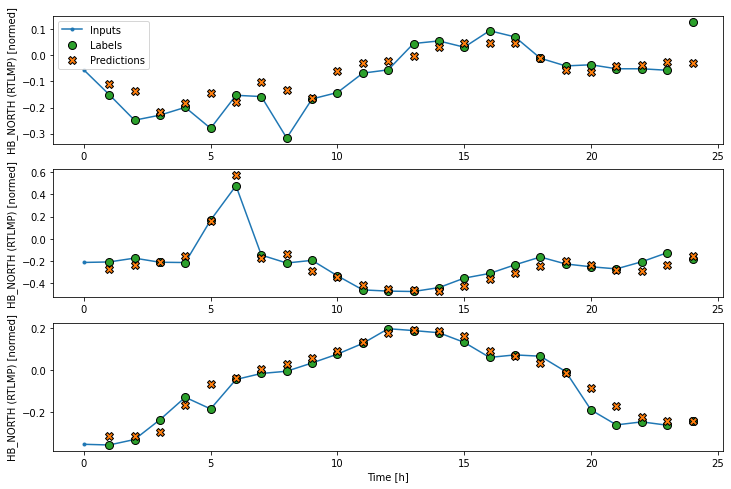

In [84]:
wide_window.plot(lstm_model)